<a href="https://colab.research.google.com/github/AshwinUniyal/CYCLE-GAN-HumanFace2Cat-or-Dog/blob/main/CycleGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Task 1

In [ ]:
# libraries
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import os

from tensorflow.keras import layers
from tensorflow import keras
! pip install tensorflow-addons==0.19.0
import tensorflow_addons as tfa
import tensorflow_datasets as tfds

tfds.disable_progress_bar()
autotune = tf.data.AUTOTUNE

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 10.7 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# from tensorflow.keras.preprocessing.image import ImageDataGenerator

# imd = ImageDataGenerator(rescale  = 1/255)

In [ ]:
!unzip '/content/drive/MyDrive/DL/cat_and_dog.zip' 
!unzip '/content/drive/MyDrive/DL/face_img.zip'
!unzip '/content/UTK Face Cropped.zip'
!unzip '/content/face_align_celeba.zip'

Streaming output truncated to the last 5000 lines.
 extracting: img_align_celeba/197600.jpg  
 extracting: img_align_celeba/197601.jpg  
 extracting: img_align_celeba/197602.jpg  
 extracting: img_align_celeba/197603.jpg  
 extracting: img_align_celeba/197604.jpg  
 extracting: img_align_celeba/197605.jpg  
 extracting: img_align_celeba/197606.jpg  
 extracting: img_align_celeba/197607.jpg  
 extracting: img_align_celeba/197608.jpg  
 extracting: img_align_celeba/197609.jpg  
 extracting: img_align_celeba/197610.jpg  
 extracting: img_align_celeba/197611.jpg  
 extracting: img_align_celeba/197612.jpg  
 extracting: img_align_celeba/197613.jpg  
 extracting: img_align_celeba/197614.jpg  
 extracting: img_align_celeba/197615.jpg  
 extracting: img_align_celeba/197616.jpg  
 extracting: img_align_celeba/197617.jpg  
 extracting: img_align_celeba/197618.jpg  
 extracting: img_align_celeba/197619.jpg  
 extracting: img_align_celeba/197620.jpg  
 extracting: img_align_celeba/197621.jpg  
 ex

In [ ]:
# import os
# os.listdir('/content/img_align_celeba')

In [ ]:
import glob
img_1 = glob.glob('/content/img_align_celeba/*.jpg')
img_2 = glob.glob('/content/utkcropped')

In [ ]:
faces_1 = '/content/img_align_celeba'

face_paths_1 = [os.path.join(faces_1, file_name) for file_name in os.listdir(faces_1) if file_name.endswith(".jpg")]

faces_2 = '/content/utkcropped'

face_paths_2 = [os.path.join(faces_2, file_name) for file_name in os.listdir(faces_2) if file_name.endswith(".jpg")]


In [ ]:
import random
random.shuffle(face_paths_1)
random.shuffle(face_paths_2)
face_paths_1[:20]

['/content/img_align_celeba/000393.jpg',
 '/content/img_align_celeba/009627.jpg',
 '/content/img_align_celeba/040188.jpg',
 '/content/img_align_celeba/025850.jpg',
 '/content/img_align_celeba/172305.jpg',
 '/content/img_align_celeba/076207.jpg',
 '/content/img_align_celeba/131153.jpg',
 '/content/img_align_celeba/183264.jpg',
 '/content/img_align_celeba/031796.jpg',
 '/content/img_align_celeba/098367.jpg',
 '/content/img_align_celeba/090208.jpg',
 '/content/img_align_celeba/185596.jpg',
 '/content/img_align_celeba/061520.jpg',
 '/content/img_align_celeba/022229.jpg',
 '/content/img_align_celeba/076750.jpg',
 '/content/img_align_celeba/104110.jpg',
 '/content/img_align_celeba/175874.jpg',
 '/content/img_align_celeba/152439.jpg',
 '/content/img_align_celeba/097281.jpg',
 '/content/img_align_celeba/123669.jpg']

In [ ]:
face_paths_1 = face_paths_1[:3500]
face_paths_2 = face_paths_2[:4000]

In [ ]:
len(face_paths_1)

3500

In [ ]:
face_df = pd.DataFrame((face_paths_1 + face_paths_2),columns = ['filepath'], dtype = 'string')

from sklearn.utils import shuffle
face_df = shuffle(face_df)
face_df

,filepath
4747,/content/utkcropped/23_1_3_20170104222844871.j...
4630,/content/utkcropped/75_0_3_20170105180253006.j...
2225,/content/img_align_celeba/139316.jpg
5189,/content/utkcropped/81_1_0_20170120225516057.j...
1490,/content/img_align_celeba/003497.jpg
...,...
3664,/content/utkcropped/55_0_0_20170117185642242.j...
3595,/content/utkcropped/60_0_0_20170116235858675.j...
4996,/content/utkcropped/22_1_1_20170113010332246.j...
6706,/content/utkcropped/30_0_4_20170105170010108.j...


In [ ]:
#all_face_data = imd.flow_from_dataframe(dataframe = face_paths, x_col = 'filepath', y_col = None, directory = None, target_size = (256,256), batch_size = 100, color_mode='rgb', class_mode=None, seed = 123, shuffle = True)

In [ ]:
!unzip '/content/cat_face.zip'
! unzip '/content/dog faces.zip'

Streaming output truncated to the last 5000 lines.
  inflating: train/000856/0015.jpg   
  inflating: train/000856/0016.jpg   
  inflating: train/000857/0001.jpg   
  inflating: train/000857/0002.jpg   
  inflating: train/000857/0003.jpg   
  inflating: train/000857/0004.jpg   
  inflating: train/000857/0005.jpg   
  inflating: train/000857/0006.jpg   
  inflating: train/000857/0007.jpg   
  inflating: train/000858/0001.jpg   
  inflating: train/000858/0002.jpg   
  inflating: train/000858/0003.jpg   
  inflating: train/000858/0004.jpg   
  inflating: train/000858/0005.jpg   
  inflating: train/000858/0006.jpg   
  inflating: train/000858/0007.jpg   
  inflating: train/000858/0008.jpg   
  inflating: train/000859/0001.jpg   
  inflating: train/000859/0002.jpg   
  inflating: train/000859/0003.jpg   
  inflating: train/000859/0004.jpg   
  inflating: train/000859/0005.jpg   
  inflating: train/000859/0006.jpg   
  inflating: train/000859/0007.jpg   
  inflating: train/000860/0001.jpg   

In [ ]:
cat_1 = '/content/Cat-faces-dataset-master/dataset-part1/dataset-part1'
cat_2 = '/content/Cat-faces-dataset-master/dataset-part2/dataset-part2'
cat_3 = '/content/Cat-faces-dataset-master/dataset-part3/dataset-part3'

cat_path_1 = [os.path.join(cat_1, file_name) for file_name in os.listdir(cat_1) if file_name.endswith(".png")]

cat_path_2 = [os.path.join(cat_2, file_name) for file_name in os.listdir(cat_2) if file_name.endswith(".png")]

cat_path_3 = [os.path.join(cat_3, file_name) for file_name in os.listdir(cat_3) if file_name.endswith(".png")]

## do same with dog data

import glob 

dog1 = []
dog2 = []
dog3 = []


pattern = "/content/test_200_database/*/*"  
for img in glob.glob(pattern):
  dog1.append(img)

pattern = "/content/test_200_single_img/*"
for img in glob.glob(pattern):
  dog2.append(img)  


pattern = "/content/train/*/*"  
for img in glob.glob(pattern):
  dog3.append(img)


In [ ]:
random.shuffle(dog1)
random.shuffle(dog2)
random.shuffle(dog3)
random.shuffle(cat_path_1)
random.shuffle(cat_path_2)
random.shuffle(cat_path_3)

In [ ]:
cat_df = pd.DataFrame((cat_path_1 + cat_path_2 + cat_path_3),columns = ['filepath'], dtype = 'string')
cat_df = shuffle(cat_df)

#all_cat_data = imd.flow_from_dataframe(dataframe = cat_df, x_col = 'filepath', y_col = None, directory = None, target_size = (256,256), batch_size = 100, color_mode='rgb', class_mode=None, seed = 123, shuffle = True)

In [ ]:
dog_df = pd.DataFrame((dog1 + dog2 + dog3),columns = ['filepath'], dtype = 'string')
dog_df = shuffle(dog_df)
#all_dog_data = imd.flow_from_dataframe(dataframe = dog_df, x_col = 'filepath', y_col = None, directory = None, target_size = (256,256), batch_size = 100, color_mode='rgb', class_mode=None, seed = 123, shuffle = True)

In [ ]:
dog_cat_df = pd.DataFrame((cat_path_1 + cat_path_2 + cat_path_3 + dog1 + dog2 + dog3),columns = ['filepath'], dtype = 'string')
dog_cat_df = shuffle(dog_cat_df)
dog_cat_df

,filepath
20973,/content/Cat-faces-dataset-master/dataset-part...
47031,/content/train/000028/0014.jpg
38776,/content/train/000700/0017.jpg
32149,/content/train/000994/0005.jpg
13950,/content/Cat-faces-dataset-master/dataset-part...
...,...
16278,/content/Cat-faces-dataset-master/dataset-part...
28587,/content/Cat-faces-dataset-master/dataset-part...
26478,/content/Cat-faces-dataset-master/dataset-part...
21978,/content/Cat-faces-dataset-master/dataset-part...


In [ ]:
dog_cat_df['filepath'][:4500]

20973    /content/Cat-faces-dataset-master/dataset-part...
47031                       /content/train/000028/0014.jpg
38776                       /content/train/000700/0017.jpg
32149                       /content/train/000994/0005.jpg
13950    /content/Cat-faces-dataset-master/dataset-part...
                               ...                        
14107    /content/Cat-faces-dataset-master/dataset-part...
1097     /content/Cat-faces-dataset-master/dataset-part...
14985    /content/Cat-faces-dataset-master/dataset-part...
38003                       /content/train/001154/0012.jpg
13520    /content/Cat-faces-dataset-master/dataset-part...
Name: filepath, Length: 4500, dtype: string

In [ ]:
# Define the standard image size.
orig_img_size = (128, 128)
# Size of the random crops to be used during training.
input_img_size = (128, 128, 3)
# Weights initializer for the layers.
kernel_init = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Gamma initializer for instance normalization.
gamma_init = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

buffer_size = 256


def preprocess(img):


    
    img = tf.io.read_file(img)
    img = tf.image.decode_image(img, channels=3, expand_animations = False)

    # Resize to the original size first
    img = tf.image.resize(img, [*orig_img_size])

    # Normalize the pixel values in the range [-1, 1]
    img = tf.cast(img, dtype=tf.float32)
    # Map values in the range [-1, 1]
    return (img / 127.5) - 1.0
    return img

In [ ]:
train_face, test_face = face_df[:200], face_df[201:350]
train_dog_cat, test_dog_cat = dog_cat_df[:200], dog_cat_df[201:350]

In [ ]:
test_dog_cat

,filepath
14581,/content/Cat-faces-dataset-master/dataset-part...
35417,/content/train/000129/0008.jpg
28826,/content/Cat-faces-dataset-master/dataset-part...
42396,/content/train/000455/0003.jpg
36648,/content/train/000825/0001.jpg
...,...
43723,/content/train/000623/0012.jpg
45566,/content/train/000209/0006.jpg
35555,/content/train/000492/0011.jpg
28357,/content/Cat-faces-dataset-master/dataset-part...


In [ ]:
batch_size=1

train_face_data = tf.data.Dataset.from_tensor_slices(train_face['filepath']).map(lambda path:preprocess(path), num_parallel_calls=autotune).cache().shuffle(50).batch(batch_size)
test_face_data = tf.data.Dataset.from_tensor_slices(test_face['filepath']).map(lambda path:preprocess(path), num_parallel_calls=autotune).cache().shuffle(50).batch(batch_size)

train_dog_cat = tf.data.Dataset.from_tensor_slices(train_dog_cat['filepath']).map(lambda path:preprocess(path), num_parallel_calls=autotune).cache().shuffle(50).batch(batch_size)
#cat_data = tf.data.Dataset.from_tensor_slices(cat_df['filepath']).map(lambda path:preprocess(path)).cache().shuffle(50).batch(batch_size)
test_dog_cat = tf.data.Dataset.from_tensor_slices(test_dog_cat['filepath']).map(lambda path:preprocess(path), num_parallel_calls=autotune).cache().shuffle(50).batch(batch_size)

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


In [ ]:
test_dog_cat

<BatchDataset element_spec=TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None)>

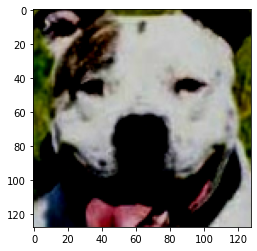

In [ ]:
x = train_dog_cat.take(2)
for i in x:
  plt.imshow(i[0])
  #print(i[0])
  plt.clim(0,1)

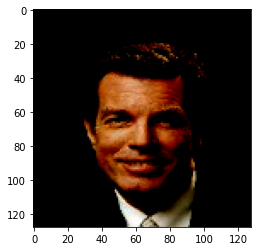

In [ ]:
x = train_face_data.take(2)
for i in x:
  plt.imshow(i[0])
  #print(i[0])
  plt.clim(0,1)

Building blocks used in the CycleGAN generators and discriminators

In [ ]:
class ReflectionPadding2D(layers.Layer):
    """Implements Reflection Padding as a layer.

    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.

    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super().__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tf.pad(input_tensor, padding_tensor, mode="REFLECT")

def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = activation(x)

    x = ReflectionPadding2D()(x)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.add([input_tensor, x])
    return x


def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",                               #changed
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",                                   #chn
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


# Build the generators
The generator consists of downsampling blocks: nine residual blocks and upsampling blocks. The structure of the generator is the following:

In [ ]:
def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=2,
    num_residual_blocks=6,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None,
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(img_input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(
        x
    )
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.Activation("relu")(x)

    # Downsampling
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    # Residual blocks
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=layers.Activation("relu"))

    # Upsampling
    for _ in range(num_upsample_blocks):
        filters //= 2
        x = upsample(x, filters, activation=layers.Activation("relu"))

    # Final block
    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = layers.Conv2D(3, (7, 7), padding="valid")(x)
    x = layers.Activation("tanh")(x)

    model = keras.models.Model(img_input, x, name=name)
    return model


Build the discriminators
The discriminators implement the following architecture: C64->C128->C256->C512

In [ ]:
def get_discriminator(
    filters=64, kernel_initializer=kernel_init, num_downsampling=3, name=None
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = layers.Conv2D(
        filters,
        (4, 4),
        strides=(2, 2),
        padding="valid",   #changed same
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = layers.LeakyReLU(0.2)(x)

    num_filters = filters
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(1, 1),
            )

    x = layers.Conv2D(
        1, (4, 4), strides=(1, 1), padding="valid", kernel_initializer=kernel_initializer    
    )(x)

    model = tf.keras.models.Model(inputs=img_input, outputs=x, name=name)
    return model


# Get the generators
gen_G = get_resnet_generator(name="generator_G")
gen_F = get_resnet_generator(name="generator_F")

# Get the discriminators
disc_X = get_discriminator(name="discriminator_X")
disc_Y = get_discriminator(name="discriminator_Y")


/usr/local/lib/python3.8/dist-packages/keras/initializers/initializers_v2.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


# Build the CycleGAN model
We will override the train_step() method of the Model class for training via fit().

In [ ]:
class CycleGan(tf.keras.Model):
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=10.0,
        lambda_identity=0.5,
    ):
        super().__init__()
        self.gen_G = generator_G
        self.gen_F = generator_F
        self.disc_X = discriminator_X
        self.disc_Y = discriminator_Y
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity

    def call(self, inputs):
      return (
        self.disc_X(inputs),
        self.disc_Y(inputs),
        self.gen_G(inputs),
        self.gen_F(inputs),
        )

    def compile(
        self,
        gen_G_optimizer,
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn,
        disc_loss_fn,
    ):
        super().compile()
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = keras.losses.MeanAbsoluteError()
        self.identity_loss_fn = keras.losses.MeanAbsoluteError()

    def train_step(self, batch_data):
        # x is Horse and y is zebra
        real_x, real_y = batch_data

        # For CycleGAN, we need to calculate different
        # kinds of losses for the generators and discriminators.
        # We will perform the following steps here:
        #
        # 1. Pass real images through the generators and get the generated images
        # 2. Pass the generated images back to the generators to check if we
        #    we can predict the original image from the generated image.
        # 3. Do an identity mapping of the real images using the generators.
        # 4. Pass the generated images in 1) to the corresponding discriminators.
        # 5. Calculate the generators total loss (adverserial + cycle + identity)
        # 6. Calculate the discriminators loss
        # 7. Update the weights of the generators
        # 8. Update the weights of the discriminators
        # 9. Return the losses in a dictionary

        with tf.GradientTape(persistent=True) as tape:
            # Horse to fake zebra
            fake_y = self.gen_G(real_x, training=True)
            # Zebra to fake horse -> y2x
            fake_x = self.gen_F(real_y, training=True)

            # Cycle (Horse to fake zebra to fake horse): x -> y -> x
            cycled_x = self.gen_F(fake_y, training=True)
            # Cycle (Zebra to fake horse to fake zebra) y -> x -> y
            cycled_y = self.gen_G(fake_x, training=True)

            # Identity mapping
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Discriminator output
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Generator adverserial loss
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator cycle loss
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )

        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
        }

## Create a callback that periodically saves generated images

In [ ]:
class GANMonitor(tf.keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=4):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(4, 2, figsize=(12, 12))
        for i, img in enumerate(test_face_data.take(self.num_img)):
            prediction = self.model.gen_G(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Input image")
            ax[i, 1].set_title("Translated image")
            ax[i, 0].axis("off")
            ax[i, 1].axis("off")

            prediction = keras.preprocessing.image.array_to_img(prediction)
            prediction.save(
                "generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch + 1)
            )
        plt.show()
        plt.close()

## Train the end-to-end model

Epoch 1/30
200/200 [==============================] - ETA: 0s - G_loss: 5.2270 - F_loss: 5.2635 - D_X_loss: 0.1858 - D_Y_loss: 0.1622

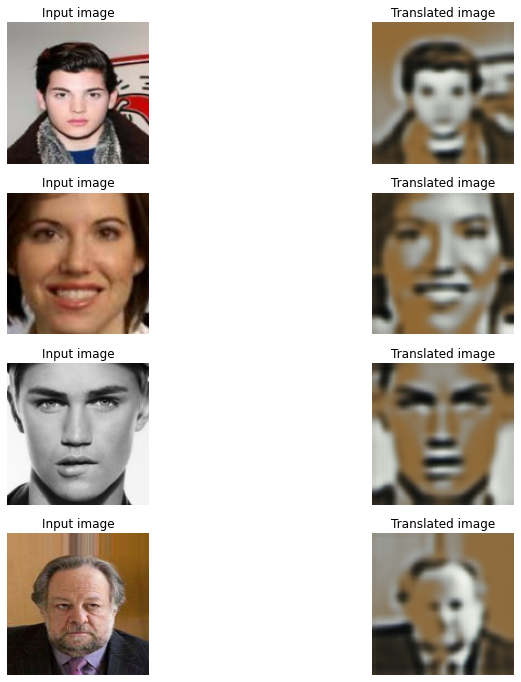

200/200 [==============================] - 132s 185ms/step - G_loss: 5.2330 - F_loss: 5.2543 - D_X_loss: 0.1859 - D_Y_loss: 0.1622
Epoch 2/30
200/200 [==============================] - ETA: 0s - G_loss: 4.7550 - F_loss: 4.5606 - D_X_loss: 0.1817 - D_Y_loss: 0.1705

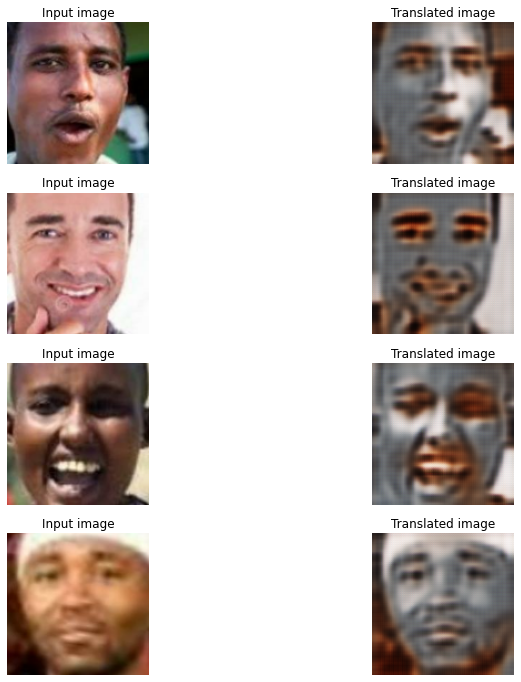

200/200 [==============================] - 70s 349ms/step - G_loss: 4.7497 - F_loss: 4.5516 - D_X_loss: 0.1815 - D_Y_loss: 0.1711
Epoch 3/30
200/200 [==============================] - ETA: 0s - G_loss: 4.6917 - F_loss: 4.4694 - D_X_loss: 0.1627 - D_Y_loss: 0.1457

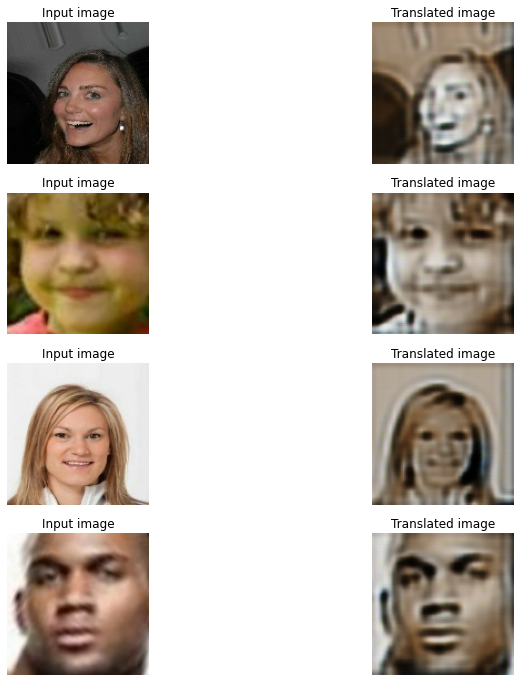

200/200 [==============================] - 40s 198ms/step - G_loss: 4.7028 - F_loss: 4.4735 - D_X_loss: 0.1630 - D_Y_loss: 0.1450
Epoch 4/30
200/200 [==============================] - ETA: 0s - G_loss: 4.5008 - F_loss: 4.3605 - D_X_loss: 0.1383 - D_Y_loss: 0.1199

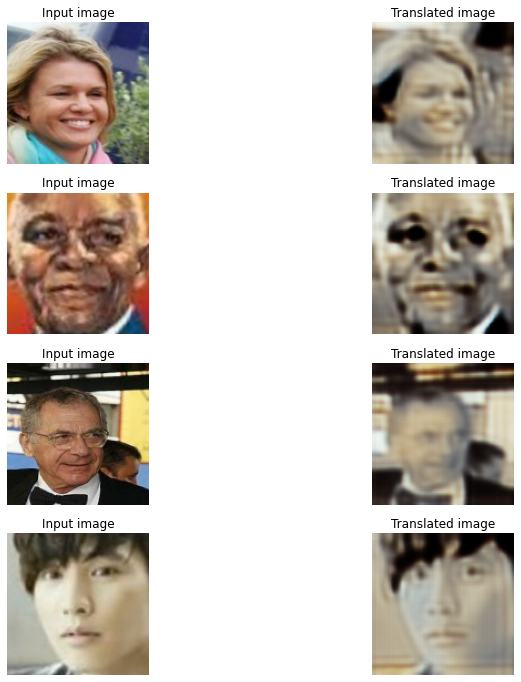

200/200 [==============================] - 71s 357ms/step - G_loss: 4.5012 - F_loss: 4.3534 - D_X_loss: 0.1380 - D_Y_loss: 0.1198
Epoch 5/30
200/200 [==============================] - ETA: 0s - G_loss: 4.2351 - F_loss: 4.0182 - D_X_loss: 0.1511 - D_Y_loss: 0.1288

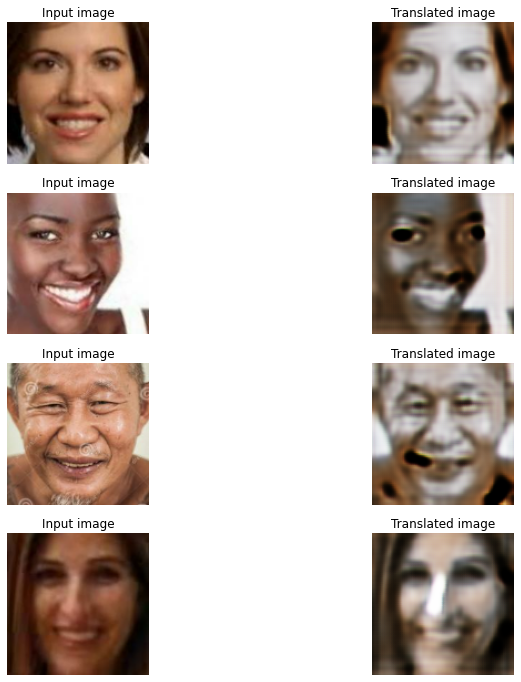

200/200 [==============================] - 41s 205ms/step - G_loss: 4.2345 - F_loss: 4.0126 - D_X_loss: 0.1508 - D_Y_loss: 0.1283
Epoch 6/30
200/200 [==============================] - ETA: 0s - G_loss: 4.0753 - F_loss: 3.8464 - D_X_loss: 0.1448 - D_Y_loss: 0.1274

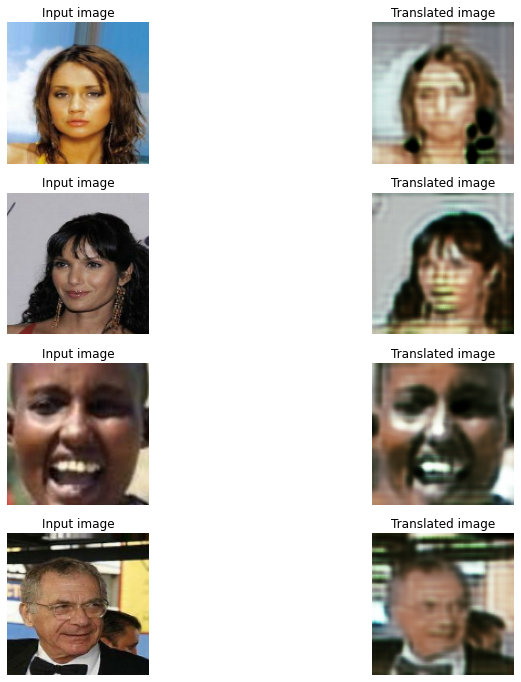

200/200 [==============================] - 67s 337ms/step - G_loss: 4.0712 - F_loss: 3.8401 - D_X_loss: 0.1447 - D_Y_loss: 0.1284
Epoch 7/30
200/200 [==============================] - ETA: 0s - G_loss: 3.9339 - F_loss: 3.6955 - D_X_loss: 0.1403 - D_Y_loss: 0.1194

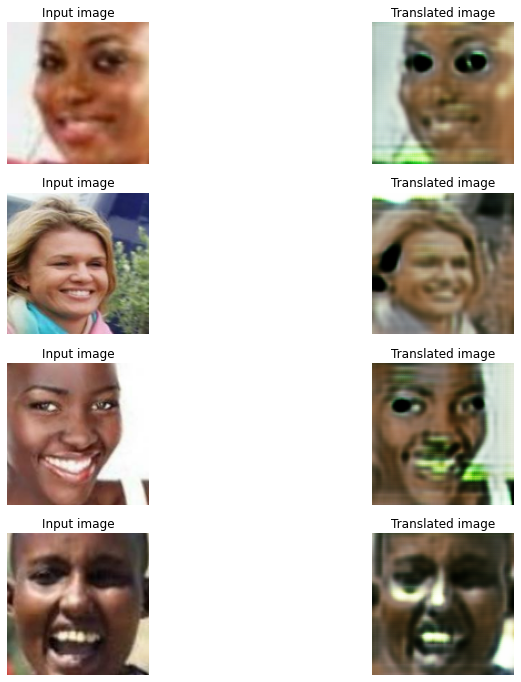

200/200 [==============================] - 40s 199ms/step - G_loss: 3.9284 - F_loss: 3.6942 - D_X_loss: 0.1397 - D_Y_loss: 0.1192
Epoch 8/30
200/200 [==============================] - ETA: 0s - G_loss: 3.8672 - F_loss: 3.6708 - D_X_loss: 0.1367 - D_Y_loss: 0.1335

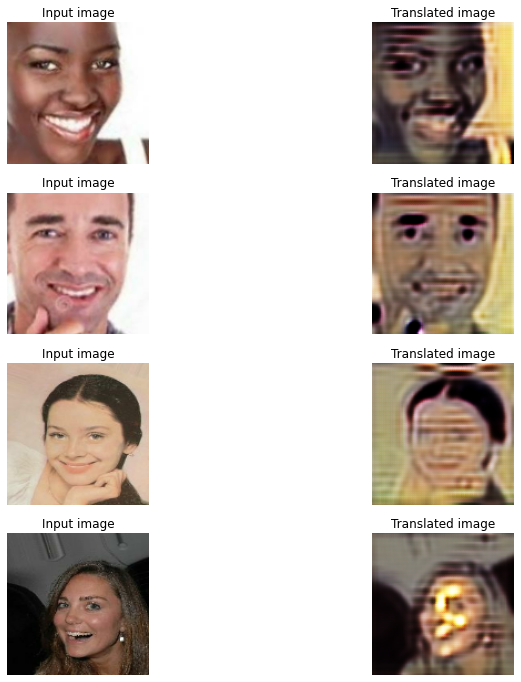

200/200 [==============================] - 67s 335ms/step - G_loss: 3.8674 - F_loss: 3.6663 - D_X_loss: 0.1368 - D_Y_loss: 0.1330
Epoch 9/30
200/200 [==============================] - ETA: 0s - G_loss: 3.7624 - F_loss: 3.6078 - D_X_loss: 0.1413 - D_Y_loss: 0.1469

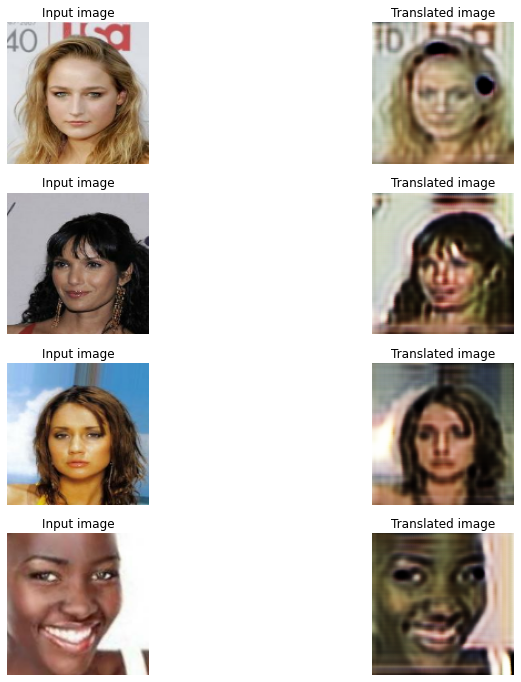

200/200 [==============================] - 40s 200ms/step - G_loss: 3.7579 - F_loss: 3.6068 - D_X_loss: 0.1411 - D_Y_loss: 0.1464
Epoch 10/30
200/200 [==============================] - ETA: 0s - G_loss: 3.7835 - F_loss: 3.5278 - D_X_loss: 0.1358 - D_Y_loss: 0.1428

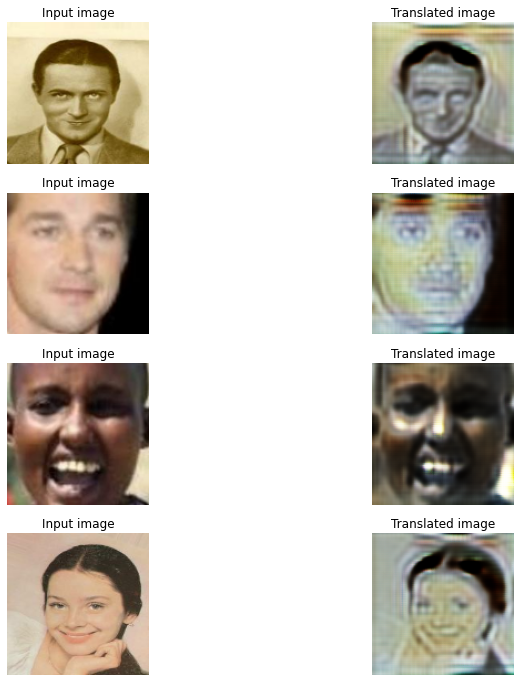

200/200 [==============================] - 74s 368ms/step - G_loss: 3.7804 - F_loss: 3.5243 - D_X_loss: 0.1352 - D_Y_loss: 0.1426
Epoch 11/30
200/200 [==============================] - ETA: 0s - G_loss: 3.6304 - F_loss: 3.5023 - D_X_loss: 0.1297 - D_Y_loss: 0.1441

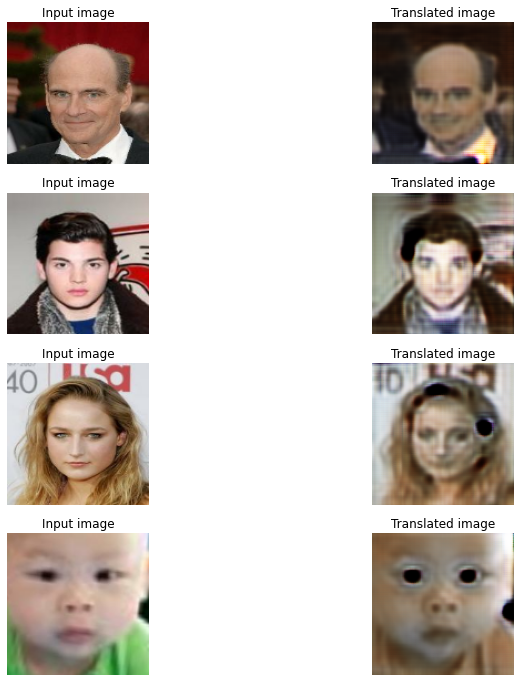

200/200 [==============================] - 45s 225ms/step - G_loss: 3.6332 - F_loss: 3.5024 - D_X_loss: 0.1299 - D_Y_loss: 0.1438
Epoch 12/30
200/200 [==============================] - ETA: 0s - G_loss: 3.6734 - F_loss: 3.4502 - D_X_loss: 0.1352 - D_Y_loss: 0.1444

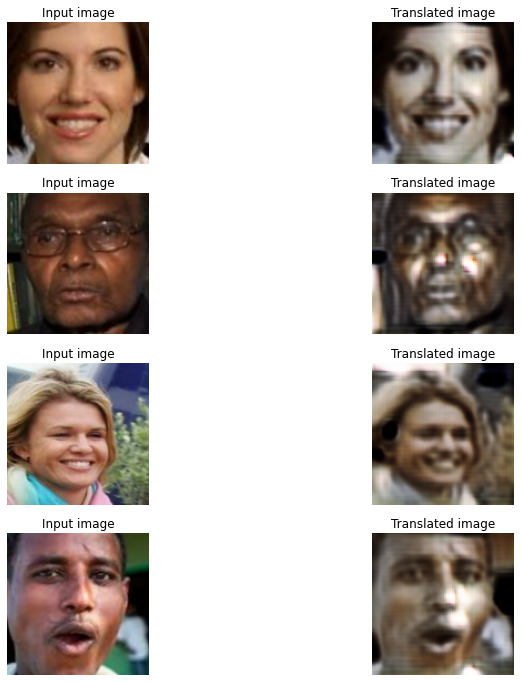

200/200 [==============================] - 73s 364ms/step - G_loss: 3.6675 - F_loss: 3.4445 - D_X_loss: 0.1351 - D_Y_loss: 0.1444
Epoch 13/30
200/200 [==============================] - ETA: 0s - G_loss: 3.6096 - F_loss: 3.4237 - D_X_loss: 0.1328 - D_Y_loss: 0.1355

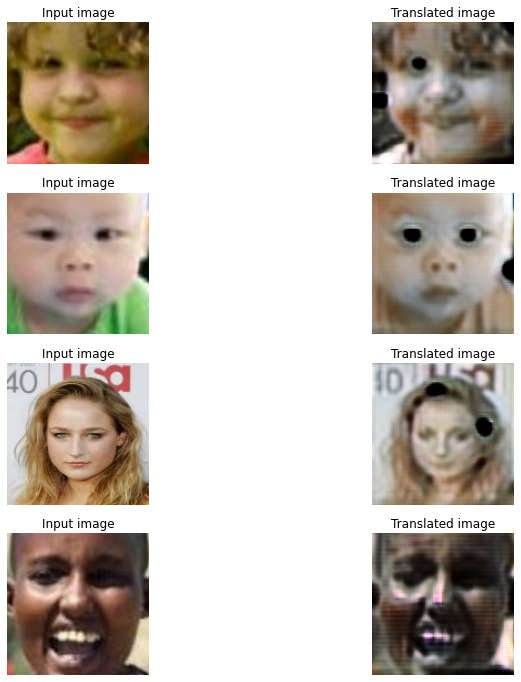

200/200 [==============================] - 43s 213ms/step - G_loss: 3.6113 - F_loss: 3.4243 - D_X_loss: 0.1325 - D_Y_loss: 0.1353
Epoch 14/30
200/200 [==============================] - ETA: 0s - G_loss: 3.6722 - F_loss: 3.4788 - D_X_loss: 0.1359 - D_Y_loss: 0.1375

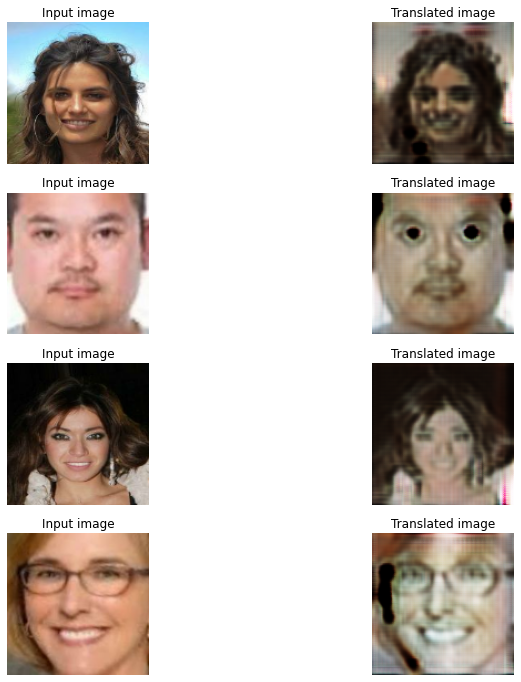

200/200 [==============================] - 73s 367ms/step - G_loss: 3.6654 - F_loss: 3.4759 - D_X_loss: 0.1359 - D_Y_loss: 0.1379
Epoch 15/30
200/200 [==============================] - ETA: 0s - G_loss: 3.6137 - F_loss: 3.3823 - D_X_loss: 0.1363 - D_Y_loss: 0.1326

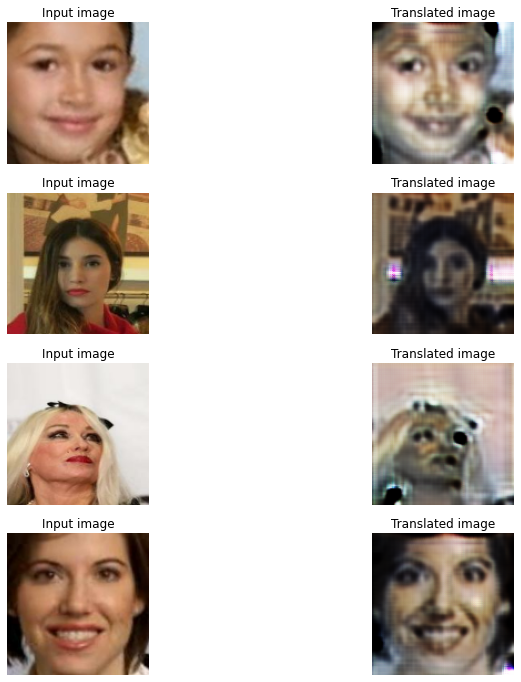

200/200 [==============================] - 44s 218ms/step - G_loss: 3.6165 - F_loss: 3.3821 - D_X_loss: 0.1364 - D_Y_loss: 0.1327
Epoch 16/30
200/200 [==============================] - ETA: 0s - G_loss: 3.6079 - F_loss: 3.4210 - D_X_loss: 0.1330 - D_Y_loss: 0.1414

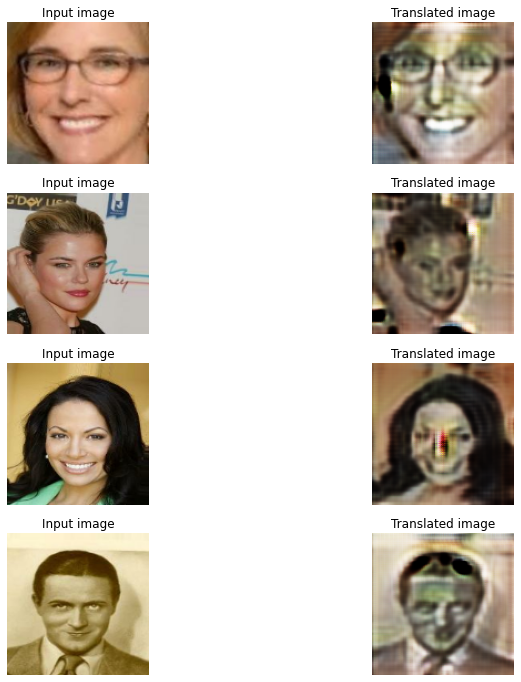

200/200 [==============================] - 75s 374ms/step - G_loss: 3.6072 - F_loss: 3.4272 - D_X_loss: 0.1326 - D_Y_loss: 0.1410
Epoch 17/30
200/200 [==============================] - ETA: 0s - G_loss: 3.5765 - F_loss: 3.4642 - D_X_loss: 0.1312 - D_Y_loss: 0.1367

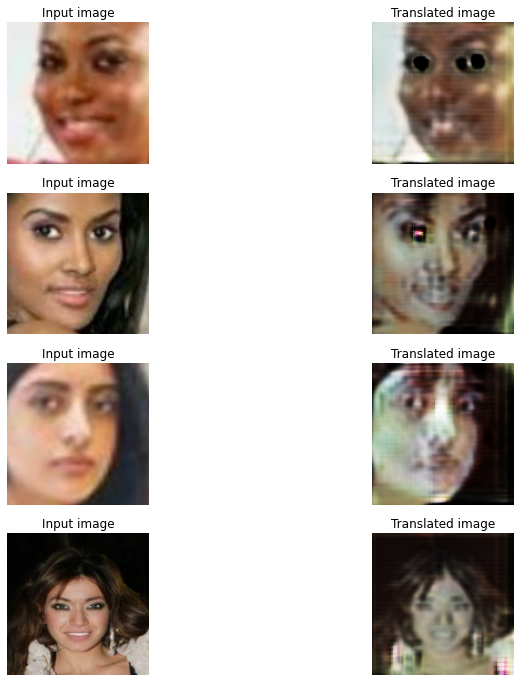

200/200 [==============================] - 44s 220ms/step - G_loss: 3.5767 - F_loss: 3.4626 - D_X_loss: 0.1310 - D_Y_loss: 0.1378
Epoch 18/30
200/200 [==============================] - ETA: 0s - G_loss: 3.4767 - F_loss: 3.4001 - D_X_loss: 0.1262 - D_Y_loss: 0.1482

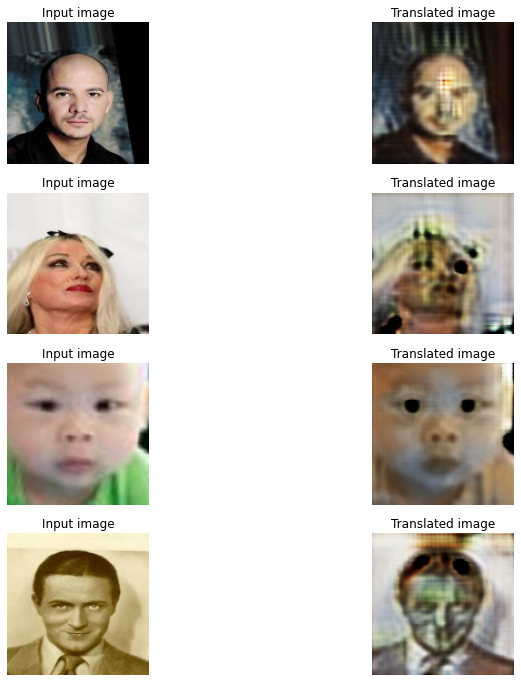

200/200 [==============================] - 76s 379ms/step - G_loss: 3.4750 - F_loss: 3.3956 - D_X_loss: 0.1261 - D_Y_loss: 0.1479
Epoch 19/30
200/200 [==============================] - ETA: 0s - G_loss: 3.6196 - F_loss: 3.4172 - D_X_loss: 0.1307 - D_Y_loss: 0.1373

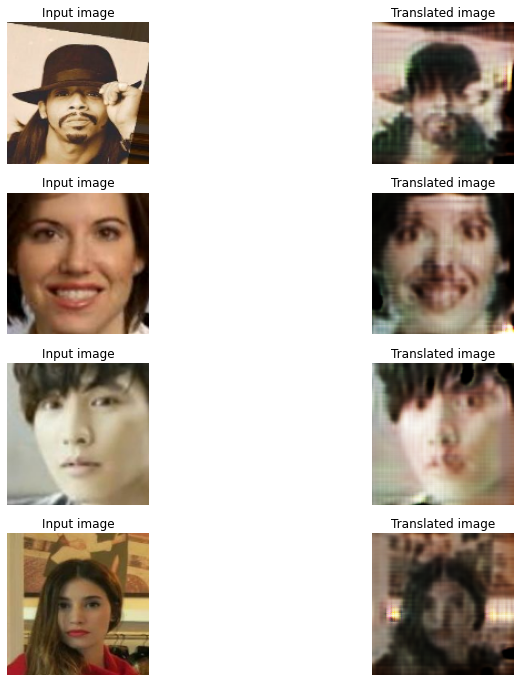

200/200 [==============================] - 44s 221ms/step - G_loss: 3.6171 - F_loss: 3.4148 - D_X_loss: 0.1309 - D_Y_loss: 0.1369
Epoch 20/30
200/200 [==============================] - ETA: 0s - G_loss: 3.4379 - F_loss: 3.3468 - D_X_loss: 0.1323 - D_Y_loss: 0.1520

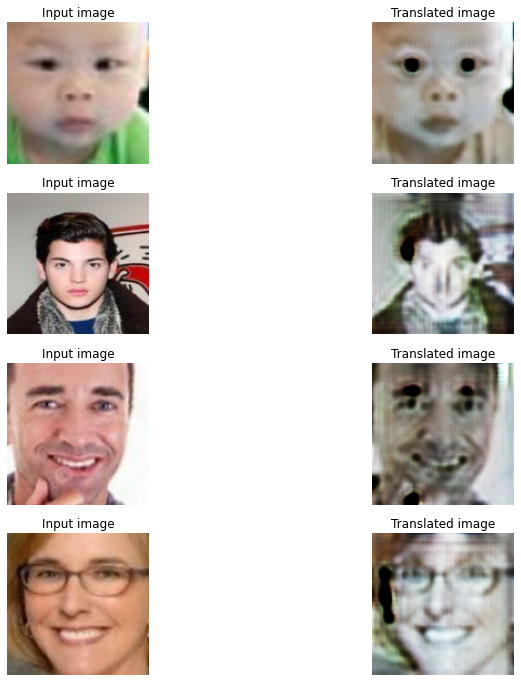

200/200 [==============================] - 77s 384ms/step - G_loss: 3.4382 - F_loss: 3.3492 - D_X_loss: 0.1319 - D_Y_loss: 0.1530
Epoch 21/30
200/200 [==============================] - ETA: 0s - G_loss: 3.5237 - F_loss: 3.4282 - D_X_loss: 0.1264 - D_Y_loss: 0.1429

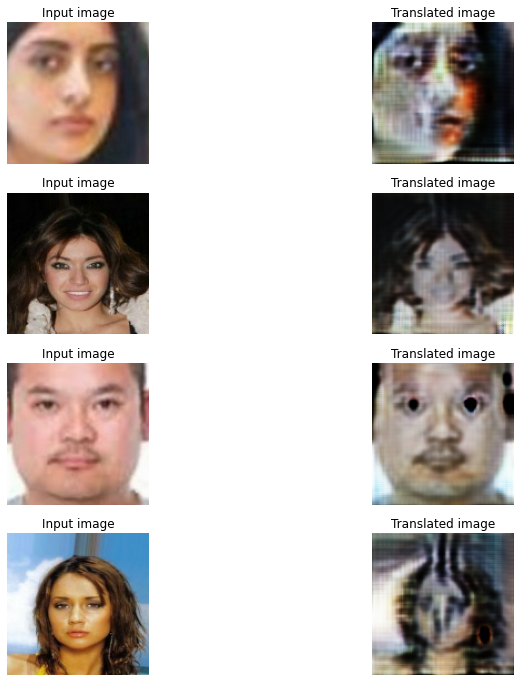

200/200 [==============================] - 46s 231ms/step - G_loss: 3.5189 - F_loss: 3.4274 - D_X_loss: 0.1261 - D_Y_loss: 0.1429
Epoch 22/30
200/200 [==============================] - ETA: 0s - G_loss: 3.5328 - F_loss: 3.5020 - D_X_loss: 0.1184 - D_Y_loss: 0.1333

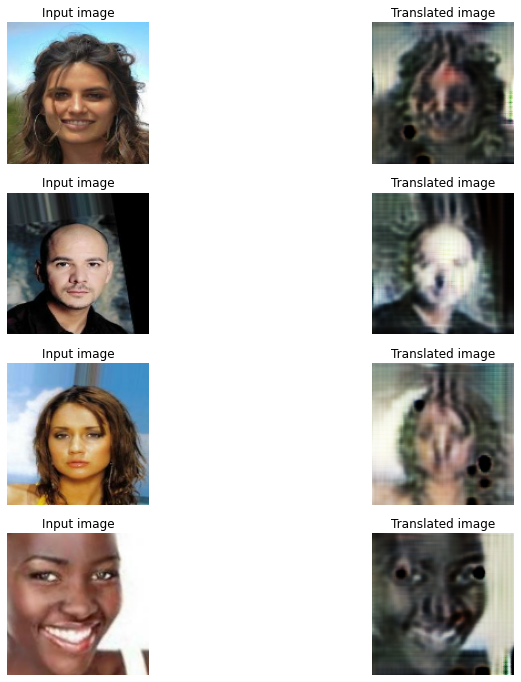

200/200 [==============================] - 77s 386ms/step - G_loss: 3.5339 - F_loss: 3.5033 - D_X_loss: 0.1182 - D_Y_loss: 0.1330
Epoch 23/30
200/200 [==============================] - ETA: 0s - G_loss: 3.5132 - F_loss: 3.3603 - D_X_loss: 0.1194 - D_Y_loss: 0.1461

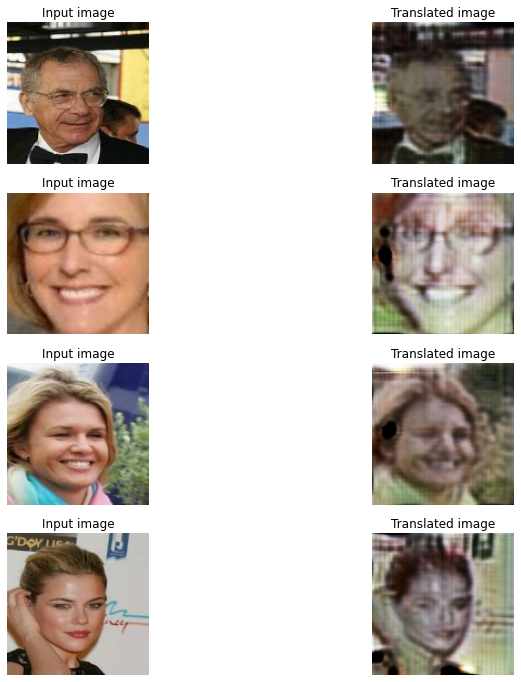

200/200 [==============================] - 46s 227ms/step - G_loss: 3.5112 - F_loss: 3.3568 - D_X_loss: 0.1192 - D_Y_loss: 0.1463
Epoch 24/30
200/200 [==============================] - ETA: 0s - G_loss: 3.5279 - F_loss: 3.3709 - D_X_loss: 0.1261 - D_Y_loss: 0.1415

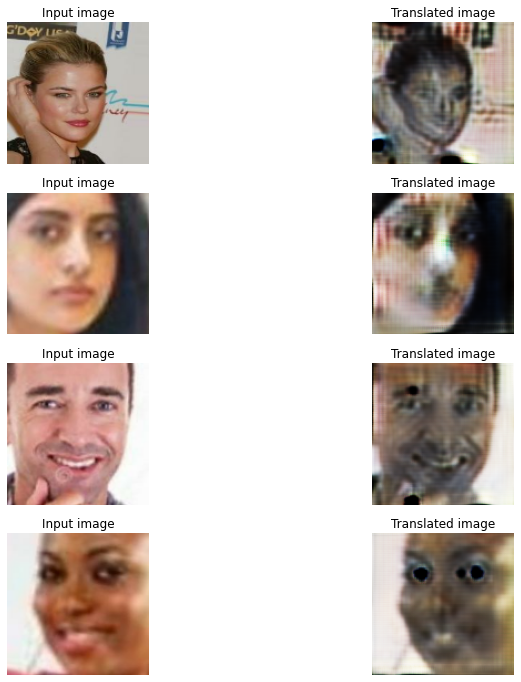

200/200 [==============================] - 76s 382ms/step - G_loss: 3.5262 - F_loss: 3.3655 - D_X_loss: 0.1264 - D_Y_loss: 0.1424
Epoch 25/30
200/200 [==============================] - ETA: 0s - G_loss: 3.5490 - F_loss: 3.3759 - D_X_loss: 0.1197 - D_Y_loss: 0.1410

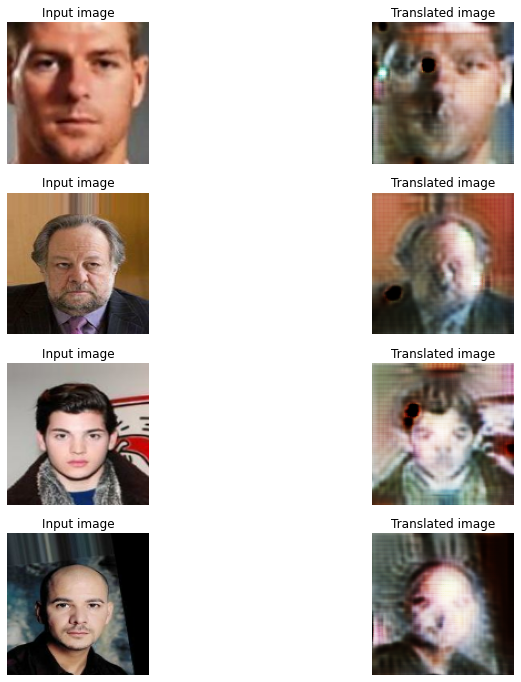

200/200 [==============================] - 46s 232ms/step - G_loss: 3.5606 - F_loss: 3.3717 - D_X_loss: 0.1194 - D_Y_loss: 0.1415
Epoch 26/30
200/200 [==============================] - ETA: 0s - G_loss: 3.5185 - F_loss: 3.3847 - D_X_loss: 0.1166 - D_Y_loss: 0.1441

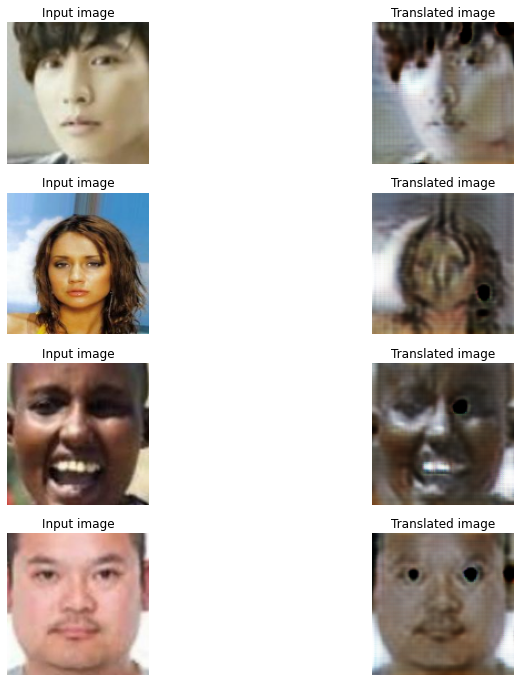

200/200 [==============================] - 77s 384ms/step - G_loss: 3.5146 - F_loss: 3.3875 - D_X_loss: 0.1161 - D_Y_loss: 0.1446
Epoch 27/30
200/200 [==============================] - ETA: 0s - G_loss: 3.5361 - F_loss: 3.4301 - D_X_loss: 0.1122 - D_Y_loss: 0.1456

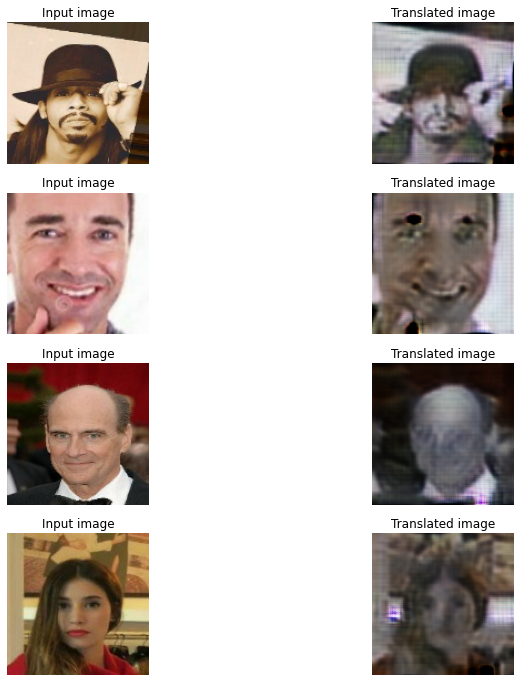

200/200 [==============================] - 45s 227ms/step - G_loss: 3.5309 - F_loss: 3.4308 - D_X_loss: 0.1119 - D_Y_loss: 0.1461
Epoch 28/30
200/200 [==============================] - ETA: 0s - G_loss: 3.5633 - F_loss: 3.3536 - D_X_loss: 0.1174 - D_Y_loss: 0.1492

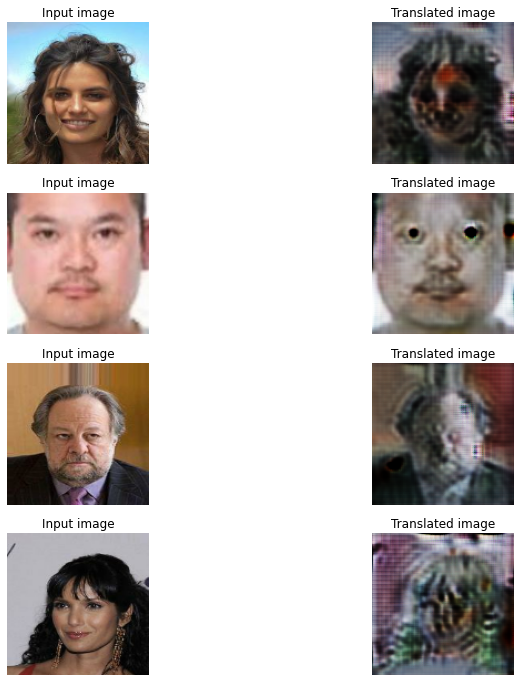

200/200 [==============================] - 76s 381ms/step - G_loss: 3.5583 - F_loss: 3.3669 - D_X_loss: 0.1174 - D_Y_loss: 0.1495
Epoch 29/30
200/200 [==============================] - ETA: 0s - G_loss: 3.5646 - F_loss: 3.5355 - D_X_loss: 0.1148 - D_Y_loss: 0.1346

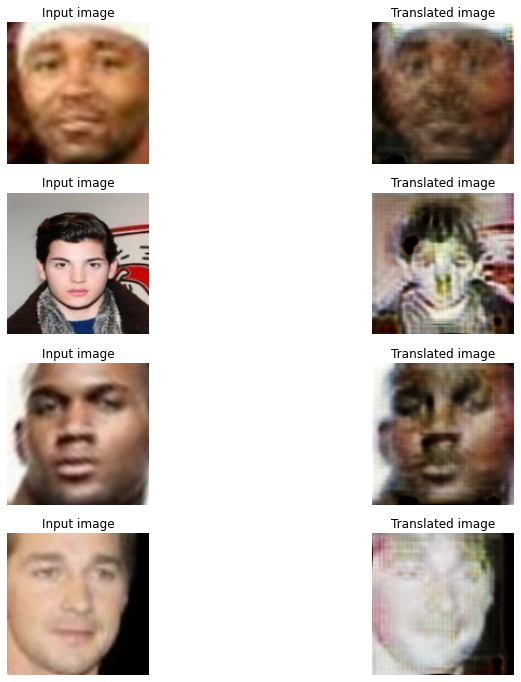

200/200 [==============================] - 46s 232ms/step - G_loss: 3.5633 - F_loss: 3.5322 - D_X_loss: 0.1150 - D_Y_loss: 0.1346
Epoch 30/30
200/200 [==============================] - ETA: 0s - G_loss: 3.6272 - F_loss: 3.3980 - D_X_loss: 0.1155 - D_Y_loss: 0.1375

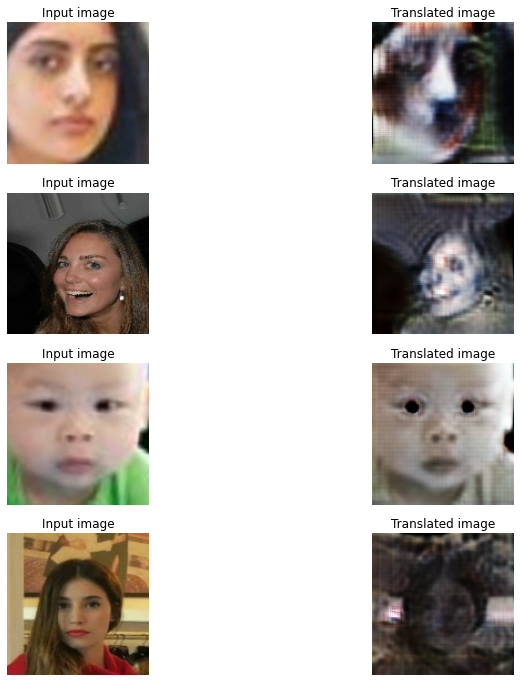

200/200 [==============================] - 79s 395ms/step - G_loss: 3.6261 - F_loss: 3.3940 - D_X_loss: 0.1161 - D_Y_loss: 0.1378


In [ ]:
# Loss function for evaluating adversarial loss
adv_loss_fn = keras.losses.MeanSquaredError()

# Define the loss function for the generators
def generator_loss_fn(fake):
    fake_loss = adv_loss_fn(tf.ones_like(fake), fake)
    return fake_loss


# Define the loss function for the discriminators
def discriminator_loss_fn(real, fake):
    real_loss = adv_loss_fn(tf.ones_like(real), real)
    fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5


# Create cycle gan model
cycle_gan_model = CycleGan(
    generator_G=gen_G, generator_F=gen_F, discriminator_X=disc_X, discriminator_Y=disc_Y
)

cycle_gan_model.compute_output_shape(input_shape=(None, 128, 128, 3))


# Compile the model
cycle_gan_model.compile(
    gen_G_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks
plotter = GANMonitor()
checkpoint_filepath = "/content/drive/MyDrive/DL/cyclegan_checkpoints.{epoch:03d}"
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_freq='epoch', period=2
)

# Here we will train the model for just one epoch as each epoch takes around
# 7 minutes on a single P100 backed machine.
cycle_gan_model.fit(
    tf.data.Dataset.zip((train_face_data, train_dog_cat)),
    epochs=30,
    callbacks=[plotter, model_checkpoint_callback],
)

##Task 2

In [ ]:
#import libraries
# Import important libraries
import pandas as pd
import numpy as np
from pathlib import Path
import random
import cv2
import matplotlib.pyplot as plt

# Split dataset
from sklearn.model_selection import train_test_split
# Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import os
from tensorflow.keras.models import Sequential


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Embedding, LSTM, Dropout, Bidirectional, Flatten

from tensorflow.keras.layers import Flatten
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow import keras

import tqdm

from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import GlobalAveragePooling2D

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip '/content/drive/MyDrive/DL/bird_CUB_200_2011.zip'

Streaming output truncated to the last 5000 lines.
  inflating: CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0067_112913.jpg  
  inflating: CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0068_113247.jpg  
  inflating: CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0073_112745.jpg  
  inflating: CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0074_111997.jpg  
  inflating: CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0079_113288.jpg  
  inflating: CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0080_111099.jpg  
  inflating: CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0082_112478.jpg  
  inflating: CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0083_111470.jpg  
  inflating: CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0084_111300.jpg  
  inflating: CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0086_111385.jpg  
  inflating: CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0092_111413.jpg  
  inflating: CUB_200_2011/images/118

## creating dataset acc to text files

In [ ]:
PATH = Path('/content/CUB_200_2011')
labels = pd.read_csv(PATH/"image_class_labels.txt", header=None, sep=" ")
labels.columns = ["id", "label"]
labels.head(10)

,id,label
0,1,1
1,2,1
2,3,1
3,4,1
4,5,1
5,6,1
6,7,1
7,8,1
8,9,1
9,10,1


In [ ]:
labels['label'].value_counts()

1      60
130    60
118    60
120    60
121    60
       ..
105    49
8      48
18     45
5      44
6      41
Name: label, Length: 200, dtype: int64

In [ ]:
train_test = pd.read_csv(PATH/"train_test_split.txt", header=None, sep=" ")
train_test.columns = ["id", "is_train"]
train_test.head(10)

,id,is_train
0,1,0
1,2,1
2,3,0
3,4,1
4,5,1
5,6,0
6,7,1
7,8,1
8,9,1
9,10,0


In [ ]:
images = pd.read_csv(PATH/"images.txt", header=None, sep=" ")
images.columns = ["id", "name"]
images.head(2)

,id,name
0,1,001.Black_footed_Albatross/Black_Footed_Albatr...
1,2,001.Black_footed_Albatross/Black_Footed_Albatr...


In [ ]:
classes = pd.read_csv(PATH/'classes.txt', header = None, sep = ' ')
classes.columns = ['id', 'class_names']
classes

,id,class_names
0,1,001.Black_footed_Albatross
1,2,002.Laysan_Albatross
2,3,003.Sooty_Albatross
3,4,004.Groove_billed_Ani
4,5,005.Crested_Auklet
...,...,...
195,196,196.House_Wren
196,197,197.Marsh_Wren
197,198,198.Rock_Wren
198,199,199.Winter_Wren


In [ ]:
## joining them all

df_labels = labels.join(train_test.set_index('id'), on='id')
df = df_labels.join(images.set_index('id'), on='id')
df = df.join(classes.set_index('id'), on='label')
df


,id,label,is_train,name,class_names
0,1,1,0,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross
1,2,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross
2,3,1,0,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross
3,4,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross
4,5,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross
...,...,...,...,...,...
11783,11784,200,1,200.Common_Yellowthroat/Common_Yellowthroat_00...,200.Common_Yellowthroat
11784,11785,200,0,200.Common_Yellowthroat/Common_Yellowthroat_00...,200.Common_Yellowthroat
11785,11786,200,0,200.Common_Yellowthroat/Common_Yellowthroat_00...,200.Common_Yellowthroat
11786,11787,200,1,200.Common_Yellowthroat/Common_Yellowthroat_00...,200.Common_Yellowthroat


In [ ]:
df['is_train'].value_counts()

# dataset is well balanced

1    5994
0    5794
Name: is_train, dtype: int64

TypeError: ignored

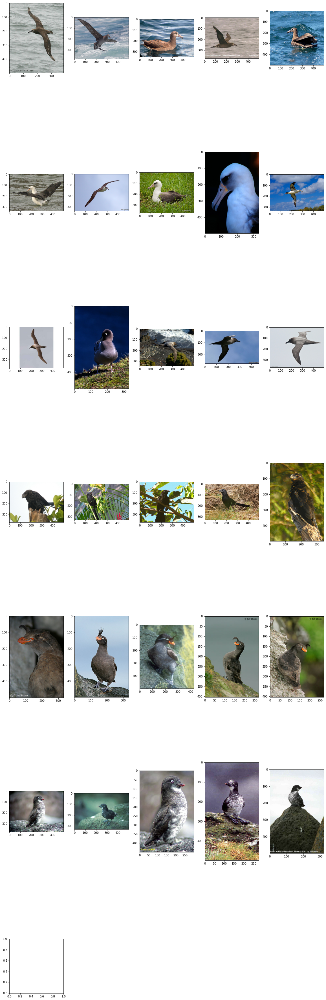

In [ ]:
## visualising images

fig = plt.figure(figsize=(20,200)) # specifying the overall grid size
row = 20
col = 5
k = 0
idx = 1

for i in range(0,20):
    k += 1
    img = df[df['label']==k].sample(n=5, random_state=1)['name']

    for j in img:
      fig.add_subplot(row, col, idx)
      plt.imshow(plt.imread(PATH/'images'/j))
      idx += 1

In [ ]:
df_train = df[df['is_train']==1]
df_test = df[df['is_train'] == 0]
df_train.head()

,id,label,is_train,name,class_names
1,2,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross
3,4,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross
4,5,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross
6,7,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross
7,8,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross


In [ ]:
df_test

,id,label,is_train,name,class_names
0,1,1,0,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross
2,3,1,0,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross
5,6,1,0,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross
9,10,1,0,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross
11,12,1,0,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross
...,...,...,...,...,...
11779,11780,200,0,200.Common_Yellowthroat/Common_Yellowthroat_00...,200.Common_Yellowthroat
11782,11783,200,0,200.Common_Yellowthroat/Common_Yellowthroat_00...,200.Common_Yellowthroat
11784,11785,200,0,200.Common_Yellowthroat/Common_Yellowthroat_00...,200.Common_Yellowthroat
11785,11786,200,0,200.Common_Yellowthroat/Common_Yellowthroat_00...,200.Common_Yellowthroat


In [ ]:
from sklearn.utils import shuffle
df_train = shuffle(df_train)
df_train.reset_index(inplace=True, drop=True)

df_test = shuffle(df_train)
df_test.reset_index(inplace=True, drop=True)

df_train

,id,label,is_train,name,class_names
0,1584,29,1,029.American_Crow/American_Crow_0119_25610.jpg,029.American_Crow
1,10368,177,1,177.Prothonotary_Warbler/Prothonotary_Warbler_...,177.Prothonotary_Warbler
2,1274,23,1,023.Brandt_Cormorant/Brandt_Cormorant_0075_229...,023.Brandt_Cormorant
3,10083,172,1,172.Nashville_Warbler/Nashville_Warbler_0129_1...,172.Nashville_Warbler
4,8647,148,1,148.Green_tailed_Towhee/Green_Tailed_Towhee_00...,148.Green_tailed_Towhee
...,...,...,...,...,...
5989,9474,162,1,162.Canada_Warbler/Canada_Warbler_0121_162310.jpg,162.Canada_Warbler
5990,7700,132,1,132.White_crowned_Sparrow/White_Crowned_Sparro...,132.White_crowned_Sparrow
5991,6983,120,1,120.Fox_Sparrow/Fox_Sparrow_0092_114774.jpg,120.Fox_Sparrow
5992,10034,171,1,171.Myrtle_Warbler/Myrtle_Warbler_0015_166713.jpg,171.Myrtle_Warbler


In [ ]:
df_test

,id,label,is_train,name,class_names
0,20,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross
1,6655,114,1,114.Black_throated_Sparrow/Black_Throated_Spar...,114.Black_throated_Sparrow
2,8276,141,1,141.Artic_Tern/Artic_Tern_0107_141181.jpg,141.Artic_Tern
3,3822,66,1,066.Western_Gull/Western_Gull_0028_55680.jpg,066.Western_Gull
4,7742,132,1,132.White_crowned_Sparrow/White_Crowned_Sparro...,132.White_crowned_Sparrow
...,...,...,...,...,...
5989,10086,172,1,172.Nashville_Warbler/Nashville_Warbler_0121_1...,172.Nashville_Warbler
5990,8233,141,1,141.Artic_Tern/Artic_Tern_0012_143410.jpg,141.Artic_Tern
5991,789,15,1,015.Lazuli_Bunting/Lazuli_Bunting_0004_14887.jpg,015.Lazuli_Bunting
5992,8894,152,1,152.Blue_headed_Vireo/Blue_Headed_Vireo_0068_1...,152.Blue_headed_Vireo


In [ ]:
df_train['label'] = df_train['label'].astype(str)
df_test['label'] = df_test['label'].astype(str)

In [ ]:
train_names = df_train['name']
train_names

0          029.American_Crow/American_Crow_0119_25610.jpg
1       177.Prothonotary_Warbler/Prothonotary_Warbler_...
2       023.Brandt_Cormorant/Brandt_Cormorant_0075_229...
3       172.Nashville_Warbler/Nashville_Warbler_0129_1...
4       148.Green_tailed_Towhee/Green_Tailed_Towhee_00...
                              ...                        
5989    162.Canada_Warbler/Canada_Warbler_0121_162310.jpg
5990    132.White_crowned_Sparrow/White_Crowned_Sparro...
5991          120.Fox_Sparrow/Fox_Sparrow_0092_114774.jpg
5992    171.Myrtle_Warbler/Myrtle_Warbler_0015_166713.jpg
5993    012.Yellow_headed_Blackbird/Yellow_Headed_Blac...
Name: name, Length: 5994, dtype: object

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen=ImageDataGenerator(rescale=1./255.,validation_split = 0.20)

In [ ]:
train_generator=datagen.flow_from_dataframe(
dataframe=df_train,
directory="/content/CUB_200_2011/images/",
x_col="name",
y_col="class_names",
subset="training",
batch_size=32,
seed=42,
shuffle=True,
class_mode="categorical",
target_size=(224,224))

Found 4796 validated image filenames belonging to 200 classes.


In [ ]:
valid_generator=datagen.flow_from_dataframe(
dataframe=df_train,
directory="/content/CUB_200_2011/images/",
x_col="name",
y_col="class_names",
subset="validation",
batch_size=32,
seed=42,
shuffle=True,
class_mode="categorical",
target_size=(224,224))

Found 1198 validated image filenames belonging to 200 classes.


In [ ]:
datagen=ImageDataGenerator(rescale=1./255.)
test_generator=datagen.flow_from_dataframe(
dataframe=df_test,
directory="/content/CUB_200_2011/images/",
x_col="name",
y_col='class_names',
batch_size=32,
seed=42,
shuffle=True,
class_mode='categorical',
target_size=(224,224))

Found 5994 validated image filenames belonging to 200 classes.


## model 1

In [ ]:
# This function defines our neural network:
def create_model():

  model = Sequential()

  # The first conv layer with 32 kernels of 3*3 receiving an input of 32*32*3:
  model.add(Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(224, 224, 3)))

  # Max pooling layer with a kernel of 2*2 and a stride of 2:
  model.add(MaxPooling2D((2, 2)))

  model.add(Dropout(0.15))

  # Conv layer with 64 kernels of 3*3:
  model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))

  # Max pooling layer with a kernel of 2*2 and a stride of 2:
  model.add(MaxPooling2D((2, 2)))

  model.add(Dropout(0.15))
  # Conv layer with 128 kernels of 3*3:
  model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))

  # Max pooling layer with a kernel of 2*2 and a stride of 2:
  model.add(MaxPooling2D((2, 2)))
  model.add(Dropout(0.15))
  # The feature maps are flattened at this point to be passed into fully-connected layers:
  model.add(Flatten())

  # Fully-connected layers leading to 10 classes with a softmax activation function:
  model.add(Dense(128, activation='relu'))
  model.add(Dense(200, activation='softmax'))



  # The model optimises cross entropy as its loss function and will monitor classification accuracy:
  model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

  # Printing model summary:
  print(model.summary())

  return model

print('Done!')


Done!


In [ ]:
model = create_model()

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_209 (Conv2D)         (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 112, 112, 32)     0         
 g2D)                                                            
                                                                 
 dropout_23 (Dropout)        (None, 112, 112, 32)      0         
                                                                 
 conv2d_210 (Conv2D)         (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_29 (MaxPoolin  (None, 56, 56, 64)       0         
 g2D)                                                            
                                                                 
 dropout_24 (Dropout)        (None, 56, 56, 64)      

In [ ]:
history = model.fit(train_generator, epochs = 10, validation_data=(valid_generator), verbose=1)

Epoch 1/10
150/150 [==============================] - 35s 222ms/step - loss: 5.3165 - accuracy: 0.0035 - val_loss: 5.2890 - val_accuracy: 0.0042
Epoch 2/10
150/150 [==============================] - 38s 255ms/step - loss: 5.2053 - accuracy: 0.0096 - val_loss: 5.1294 - val_accuracy: 0.0150
Epoch 3/10
150/150 [==============================] - 38s 252ms/step - loss: 4.9861 - accuracy: 0.0183 - val_loss: 5.0083 - val_accuracy: 0.0134
Epoch 4/10
150/150 [==============================] - 32s 211ms/step - loss: 4.7706 - accuracy: 0.0400 - val_loss: 4.8535 - val_accuracy: 0.0392
Epoch 5/10
150/150 [==============================] - 37s 247ms/step - loss: 4.3912 - accuracy: 0.0824 - val_loss: 4.7743 - val_accuracy: 0.0442
Epoch 6/10
150/150 [==============================] - 37s 247ms/step - loss: 3.5745 - accuracy: 0.2139 - val_loss: 5.1779 - val_accuracy: 0.0518
Epoch 7/10
150/150 [==============================] - 32s 216ms/step - loss: 2.3747 - accuracy: 0.4529 - val_loss: 6.4784 - val_ac

## model 2 VGG16

In [ ]:
from keras.models import Model

# This function creates our classification network, this time pre-trained on ImageNet:
def create_model():

  # Keras can already provide us with a pre-trained network just by setting the weights argument to imagenet:
  base_model = VGG16(input_shape=(224,224,3), weights='imagenet', include_top=False)

  add_model = Sequential()
  add_model.add(Flatten(input_shape=base_model.output_shape[1:]))
  add_model.add(Dense(256, activation='relu'))
  add_model.add(Dense(200, activation='softmax'))

  model = Model(inputs=base_model.input, outputs=add_model(base_model.output))


  for layer in model.layers[:18]:
    layer.trainable = False
  # x = base_model.output
  # x = GlobalAveragePooling2D()(x)
  # output = keras.layers.Dense(200, activation='softmax')(x)
  # model = Model(inputs=[base_model.input], outputs=[output])

  # The optimiser is stochastic gradient descent with a learning rate of 0.01 and a momentum of 0.9:
  optim = Adam(learning_rate=0.001)

  # The model optimises cross entropy as its loss function and will monitor classification accuracy:
  model.compile(optimizer=optim, loss='categorical_crossentropy', metrics=['accuracy'])

  # Printing model summary:
  print(model.summary())

  return model

print('Done!')

Done!


In [ ]:
# Create the model:
model = create_model()

58889256/58889256 [==============================] - 0s 0us/step
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

In [ ]:
history = model.fit(train_generator, epochs = 10, validation_data=(valid_generator), verbose=1)


Epoch 1/10


InvalidArgumentError: ignored

In [ ]:
### MODEL 3
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras import Model


pre_trained_model = InceptionV3(
    input_shape=(224,224, 3),
    include_top=False,
    weights='imagenet'
)

# Make all the layers in the pre-trained model non-trainable
for layer in pre_trained_model.layers:
  layer.trainable = False



87910968/87910968 [==============================] - 3s 0us/step


In [ ]:
last_layer = pre_trained_model.get_layer('mixed7')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

from tensorflow.keras.optimizers import RMSprop

# Flatten the output layer to 1 dimension
x = layers.Flatten()(last_output)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = layers.Dense(1024, activation='relu')(x)
# Add a dropout rate of 0.2
x = layers.Dropout(.2)(x)                  
# Add a final sigmoid layer for classification
x = layers.Dense(200, activation='softmax')(x)           

model = Model(pre_trained_model.input, x) 

model.compile(
    optimizer=RMSprop(lr=0.0001), 
    loss='categorical_crossentropy', 
    metrics=['accuracy']
)

model.summary()

last layer output shape:  (None, 12, 12, 768)
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )             

In [ ]:
inceptionv3_history=model.fit(train_generator, epochs = 10, validation_data=(valid_generator), verbose=1)

Epoch 1/10
150/150 [==============================] - 42s 257ms/step - loss: 7.8163 - accuracy: 0.0146 - val_loss: 5.0420 - val_accuracy: 0.0334
Epoch 2/10
150/150 [==============================] - 34s 225ms/step - loss: 4.3313 - accuracy: 0.1070 - val_loss: 4.1595 - val_accuracy: 0.0902
Epoch 3/10
150/150 [==============================] - 38s 250ms/step - loss: 2.6575 - accuracy: 0.3688 - val_loss: 3.8450 - val_accuracy: 0.1678
Epoch 4/10
150/150 [==============================] - 33s 221ms/step - loss: 1.4283 - accuracy: 0.6316 - val_loss: 4.0368 - val_accuracy: 0.1853
Epoch 5/10
150/150 [==============================] - 35s 232ms/step - loss: 0.8135 - accuracy: 0.7723 - val_loss: 4.4307 - val_accuracy: 0.2270
Epoch 6/10
150/150 [==============================] - 33s 219ms/step - loss: 0.5156 - accuracy: 0.8503 - val_loss: 4.9418 - val_accuracy: 0.1987
Epoch 7/10
150/150 [==============================] - 37s 248ms/step - loss: 0.4011 - accuracy: 0.8828 - val_loss: 4.9576 - val_ac

In [ ]:
model.evaluate(test_generator)

188/188 [==============================] - 33s 175ms/step - loss: 0.0381 - accuracy: 0.9950


[0.03808705881237984, 0.9949992895126343]

# InceptionV3 part 2

In [ ]:
from keras import applications
from keras import optimizers, losses, activations, models


base_model = applications.InceptionV3(weights='imagenet', 
                                include_top=False, 
                                input_shape=(224, 224,3))
base_model.trainable = False

add_model = Sequential()

add_model.add(base_model)
#add_model.add(Flatten(input_shape=base_model.output_shape[1:]))

add_model.add(GlobalAveragePooling2D())
add_model.add(Dropout(0.2))


add_model.add(Dense(500, activation='relu'))

add_model.add(Dense(200, 
                    activation='softmax'))

model = add_model
model.compile(loss='categorical_crossentropy', 
              optimizer=optimizers.SGD(learning_rate=0.001, 
                                       momentum=0.9),
              metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_1 (Dropout)         (None, 2048)              0         
                                                                 
 dense_2 (Dense)             (None, 500)               1024500   
                                                                 
 dense_3 (Dense)             (None, 200)               100200    
                                                                 
Total params: 22,927,484
Trainable params: 1,124,700
Non-trainable params: 21,802,784
__________________________________

In [ ]:
history = model.fit(train_generator, epochs = 100, validation_data=(valid_generator), verbose=1)

Epoch 1/100
150/150 [==============================] - 32s 188ms/step - loss: 5.2742 - accuracy: 0.0204 - val_loss: 4.8827 - val_accuracy: 0.0634
Epoch 2/100
150/150 [==============================] - 26s 176ms/step - loss: 4.6042 - accuracy: 0.0899 - val_loss: 4.2904 - val_accuracy: 0.1444
Epoch 3/100
150/150 [==============================] - 27s 178ms/step - loss: 3.9313 - accuracy: 0.1785 - val_loss: 3.7347 - val_accuracy: 0.1928
Epoch 4/100
150/150 [==============================] - 27s 179ms/step - loss: 3.3924 - accuracy: 0.2481 - val_loss: 3.3522 - val_accuracy: 0.2504
Epoch 5/100
150/150 [==============================] - 27s 177ms/step - loss: 3.0022 - accuracy: 0.3050 - val_loss: 3.1071 - val_accuracy: 0.2763
Epoch 6/100
150/150 [==============================] - 27s 177ms/step - loss: 2.7072 - accuracy: 0.3490 - val_loss: 2.9460 - val_accuracy: 0.3022
Epoch 7/100
150/150 [==============================] - 27s 178ms/step - loss: 2.4928 - accuracy: 0.3853 - val_loss: 2.7923 -

KeyboardInterrupt: ignored

In [ ]:
model.evaluate(test_generator)

188/188 [==============================] - 38s 197ms/step - loss: 4.6486 - accuracy: 0.1121


[4.6486406326293945, 0.11211211234331131]

In [ ]:
## model 4

model=Sequential()
model.add(Conv2D(filters=32,kernel_size=(4,4),input_shape=(224,224,3),activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Flatten())
model.add(Dense(200,activation='softmax'))
model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(200, activation='softmax'))
model.build()
model.compile(
    optimizer=RMSprop(learning_rate=0.0001), 
    loss='categorical_crossentropy', 
    metrics=['accuracy']
)

model.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_208 (Conv2D)         (None, 221, 221, 32)      1568      
                                                                 
 max_pooling2d_27 (MaxPoolin  (None, 110, 110, 32)     0         
 g2D)                                                            
                                                                 
 flatten_26 (Flatten)        (None, 387200)            0         
                                                                 
 dense_43 (Dense)            (None, 200)               77440200  
                                                                 
 flatten_27 (Flatten)        (None, 200)               0         
                                                                 
 dense_44 (Dense)            (None, 1024)              205824    
                                                     

In [ ]:
history=model.fit(train_generator, epochs = 5, validation_data=(valid_generator), verbose=1)

Epoch 1/5
150/150 [==============================] - 37s 239ms/step - loss: 5.2993 - accuracy: 0.0060 - val_loss: 5.2998 - val_accuracy: 0.0025
Epoch 2/5
150/150 [==============================] - 30s 198ms/step - loss: 5.2990 - accuracy: 0.0063 - val_loss: 5.2993 - val_accuracy: 0.0050
Epoch 3/5
150/150 [==============================] - 30s 200ms/step - loss: 5.2970 - accuracy: 0.0050 - val_loss: 5.2970 - val_accuracy: 0.0025
Epoch 4/5
150/150 [==============================] - 36s 238ms/step - loss: 5.2936 - accuracy: 0.0075 - val_loss: 5.2960 - val_accuracy: 0.0025
Epoch 5/5
150/150 [==============================] - 30s 203ms/step - loss: 5.2883 - accuracy: 0.0054 - val_loss: 5.2903 - val_accuracy: 0.0033


In [ ]:
model.evaluate(test_generato

188/188 [==============================] - 29s 154ms/step - loss: 0.0315 - accuracy: 0.9950


[0.031480979174375534, 0.9949992895126343]